In [80]:

import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse 
import numpy as np
import pandas as pd
from pandas.plotting import scatter_matrix as sm
from scipy.spatial.distance import cdist
import seaborn as sns
from sklearn import preprocessing
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.metrics.cluster import adjusted_rand_score

In [81]:
df = pd.read_csv("job-market.csv")

In [82]:
df.head(3)

,Id,Title,Company,Date,Location,Area,Classification,SubClassification,Requirement,FullDescription,LowestSalary,HighestSalary,JobType
0,37404348.0,Casual Stock Replenisher,Aldi Stores,2018-10-07T00:00:00.000Z,Sydney,North West & Hills District,Retail & Consumer Products,Retail Assistants,Our Casual Stock Replenishers pride themselves...,NaN,0.0,30.0,NaN
1,37404337.0,Casual Stock Replenisher,Aldi Stores,2018-10-07T00:00:00.000Z,Richmond & Hawkesbury,NaN,Retail & Consumer Products,Retail Assistants,Our Casual Stock Replenishers pride themselves...,NaN,0.0,30.0,NaN
2,37404356.0,RETAIL SALES SUPERSTARS and STYLISTS Wanted - ...,LB Creative Pty Ltd,2018-10-07T00:00:00.000Z,Brisbane,CBD & Inner Suburbs,Retail & Consumer Products,Retail Assistants,BRAND NEW FLAGSHIP STORE OPENING - SUNSHINE PLAZA,NaN,0.0,30.0,NaN


In [83]:
Location_of_Jobs =df['Location'].value_counts()
Location_of_Jobs

Sydney                                  2784
Melbourne                               2481
Brisbane                                1119
Perth                                    677
Adelaide                                 390
                                        ... 
Fleurieu Peninsula & Kangaroo Island       6
Tumut, Snowy & Monaro                      4
Somerset & Lockyer                         4
Central & South East TAS                   3
Coober Pedy & Outback SA                   1
Name: Location, Length: 65, dtype: int64

<AxesSubplot:>

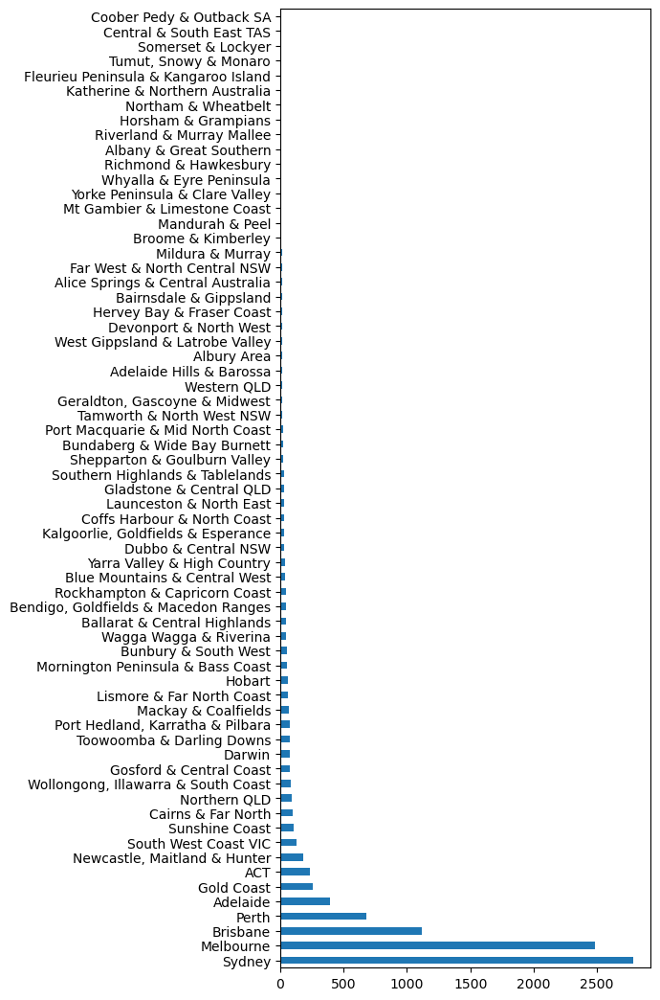

In [84]:
%matplotlib inline
Location_of_Jobs.plot(kind='barh', figsize=(5,13))

# Jobs posts by Salary Range


/var/folders/h0/8_wby_212cs0h3_gmjklt61c0000gn/T/ipykernel_52695/2407158326.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Range'] = data.apply(lambda row: str(row['LowestSalary']) + ' - ' + str(row['HighestSalary']), axis=1)


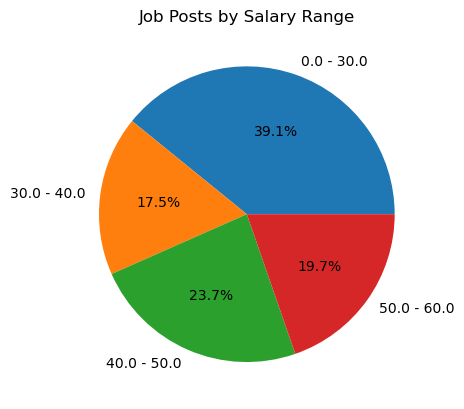

In [94]:
import matplotlib
data = df.dropna()

data['Range'] = data.apply(lambda row: str(row['LowestSalary']) + ' - ' + str(row['HighestSalary']), axis=1)
pieGrouped = data.groupby('Range')['Id'].count()
pieGrouped
fig, ax = plt.subplots()
ax.pie(pieGrouped.values, labels=pieGrouped.index, autopct= '%1.1f%%')
ax.set_title('Job Posts by Salary Range')
plt.show()

In [87]:
#explore other aspects of the dataset

In [88]:
No_Company = df['Company'].value_counts()
No_Company.head(20)

Jora Local                                 764
Design & Build                              86
Programmed Skilled Workforce                67
HOBAN Recruitment                           44
Coles                                       44
Smaart Recruitment                          37
Hays Talent Solutions                       35
Drake International                         35
Hays Accountancy & Finance                  35
Aldi Stores                                 34
McArthur                                    33
RETAILWORLD RESOURCING                      31
Gough Property & Real Estate Recruiters     30
Hays Trades & Labour                        29
Hays Office Support                         28
Hudson                                      27
My Joblist                                  27
Proforce                                    25
Robert Walters                              24
Zoom Recruitment & Training                 23
Name: Company, dtype: int64

Barh chart displaying the top twenty companies that have the most employees:
    Jora Local has the largest group of employees. 

<AxesSubplot:>

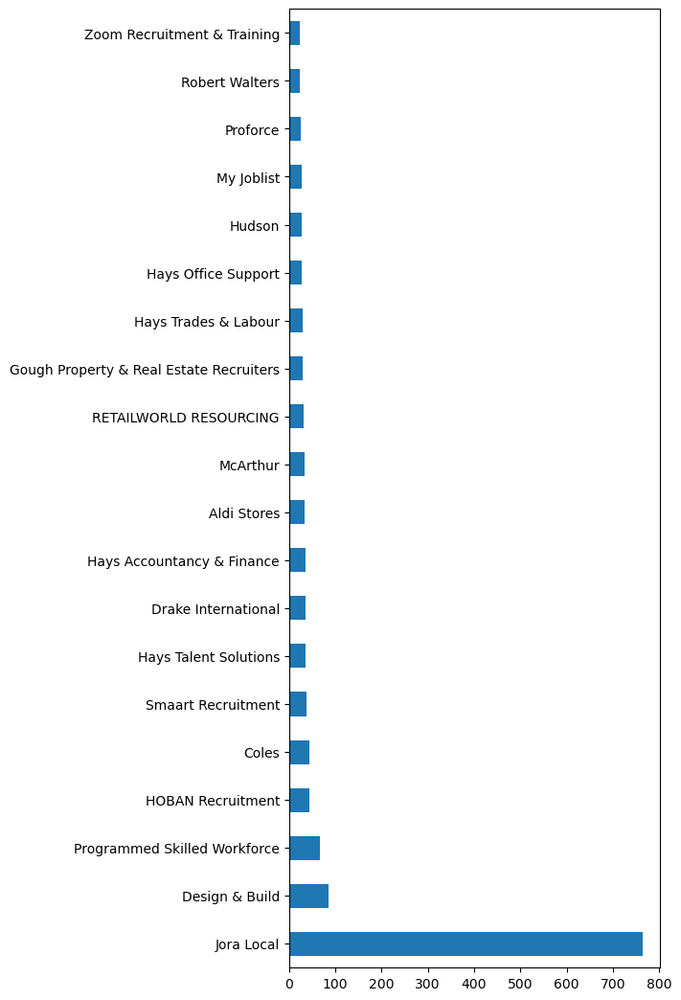

In [66]:
No_Company.head(20).plot(kind='barh', figsize=(5,13))

# 2. Data Correlation

In [67]:
wd = pd.read_csv("wine.data.csv")

In [68]:
wd.head(4)

,Label,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480


In [69]:
label = wd['Label']
del wd['Label']

In [70]:
label.unique()

array([1, 2, 3])

In [71]:
wd.corr()

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline
Alcohol,1.000000,0.094397,0.211545,-0.310235,0.270798,0.289101,0.236815,-0.155929,0.136698,0.546364,-0.071747,0.072343,0.643720
Malic acid,0.094397,1.000000,0.164045,0.288500,-0.054575,-0.335167,-0.411007,0.292977,-0.220746,0.248985,-0.561296,-0.368710,-0.192011
Ash,0.211545,0.164045,1.000000,0.443367,0.286587,0.128980,0.115077,0.186230,0.009652,0.258887,-0.074667,0.003911,0.223626
Alcalinity of ash,-0.310235,0.288500,0.443367,1.000000,-0.083333,-0.321113,-0.351370,0.361922,-0.197327,0.018732,-0.273955,-0.276769,-0.440597
Magnesium,0.270798,-0.054575,0.286587,-0.083333,1.000000,0.214401,0.195784,-0.256294,0.236441,0.199950,0.055398,0.066004,0.393351
Total phenols,0.289101,-0.335167,0.128980,-0.321113,0.214401,1.000000,0.864564,-0.449935,0.612413,-0.055136,0.433681,0.699949,0.498115
Flavanoids,0.236815,-0.411007,0.115077,-0.351370,0.195784,0.864564,1.000000,-0.537900,0.652692,-0.172379,0.543479,0.787194,0.494193
Nonflavanoid phenols,-0.155929,0.292977,0.186230,0.361922,-0.256294,-0.449935,-0.537900,1.000000,-0.365845,0.139057,-0.262640,-0.503270,-0.311385
Proanthocyanins,0.136698,-0.220746,0.009652,-0.197327,0.236441,0.612413,0.652692,-0.365845,1.000000,-0.025250,0.295544,0.519067,0.330417
Color intensity,0.546364,0.248985,0.258887,0.018732,0.199950,-0.055136,-0.172379,0.139057,-0.025250,1.000000,-0.521813,-0.428815,0.316100


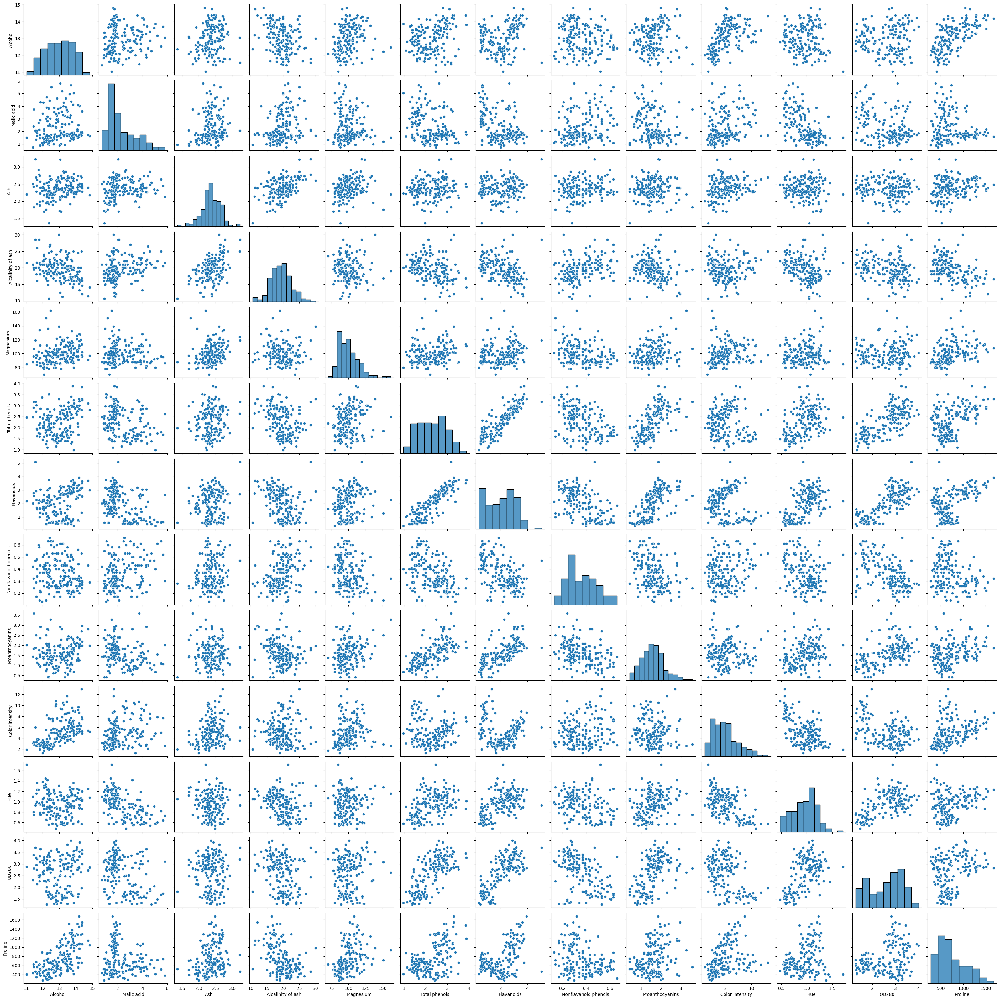

In [79]:
sns.pairplot(wd)
plt.show()

<AxesSubplot:>

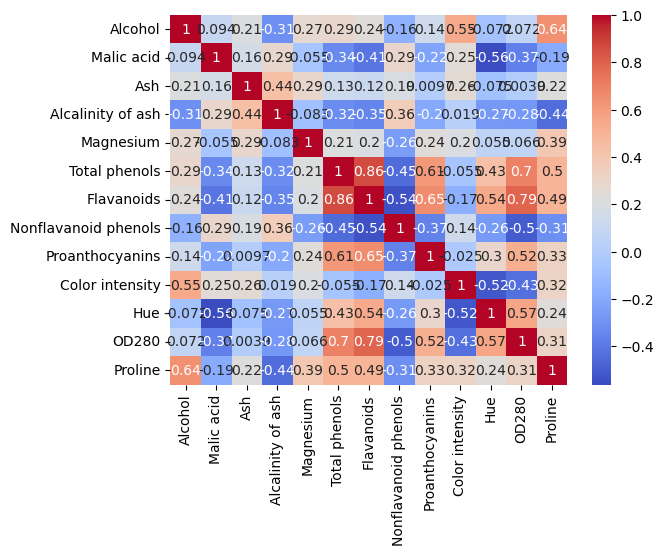

In [77]:
sns.heatmap(wd.corr(),cmap='coolwarm',annot=True)


Analysis:
List three pairs of attributes which have the largest correlation?

Blue- less correlation Red - greatest correlation

So the pairs with the most correlation are 'total phenols-Flavanoids' (with 0.86), 'Flavanoids-OD280' (with0.79) and 'total phenols' (with 0.70).

In [96]:
kMeansClustering = KMeans(n_clusters = 3, random_state=0)
res = kMeansClustering.fit_predict(wd)

label_pred_KM = res + 1
print("Labels predicted by K-Means:",label_pred_KM)
print('Length of labels is same as data entry', label_pred_KM.shape)

centroids_KM= kMeansClustering.cluster_centers_
print("Shape of centroids_KM",centroids_KM.shape)
print("Centroids:",centroids_KM)

inertia_KM = kMeansClustering
print("Inertia:",inertia_KM)

Labels predicted by K-Means: [2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 2 2 1 1 2 2 1 2 2 2 2 2 2 1 1
 2 2 1 1 2 2 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 1 3 1 3 3 1 3 3 1 1 1 3 3 2
 1 3 3 3 1 3 3 1 1 3 3 3 3 3 1 1 3 3 3 3 3 1 1 3 1 3 1 3 3 3 1 3 3 3 3 1 3
 3 1 3 3 3 3 3 3 3 1 3 3 3 3 3 3 3 3 3 1 3 3 1 1 1 1 3 3 3 1 1 3 3 1 1 3 1
 1 3 3 3 3 1 1 1 3 1 1 1 3 1 3 1 1 3 1 1 1 1 3 3 1 1 1 1 1 3]
Length of labels is same as data entry (178,)
Shape of centroids_KM (3, 13)
Centroids: [[1.29298387e+01 2.50403226e+00 2.40806452e+00 1.98903226e+01
  1.03596774e+02 2.11112903e+00 1.58403226e+00 3.88387097e-01
  1.50338710e+00 5.65032258e+00 8.83967742e-01 2.36548387e+00
  7.28338710e+02]
 [1.38044681e+01 1.88340426e+00 2.42617021e+00 1.70234043e+01
  1.05510638e+02 2.86723404e+00 3.01425532e+00 2.85319149e-01
  1.91042553e+00 5.70255319e+00 1.07829787e+00 3.11404255e+00
  1.19514894e+03]
 [1.25166667e+01 2.49420290e+00 2.28855072e+00 2.08231884e+01
  9.23478261e+01 2.07072464e+00 1.75840580e+00 3.901

In [38]:
kMeansClustering = KMeans(n_clusters = 3, random_state=0)

In [35]:
res = kMeansClustering.fit_predict(wd)
label_pred_KM = res + 1

In [36]:
wd["cluster"] = label_pred_KM.astype('float64')

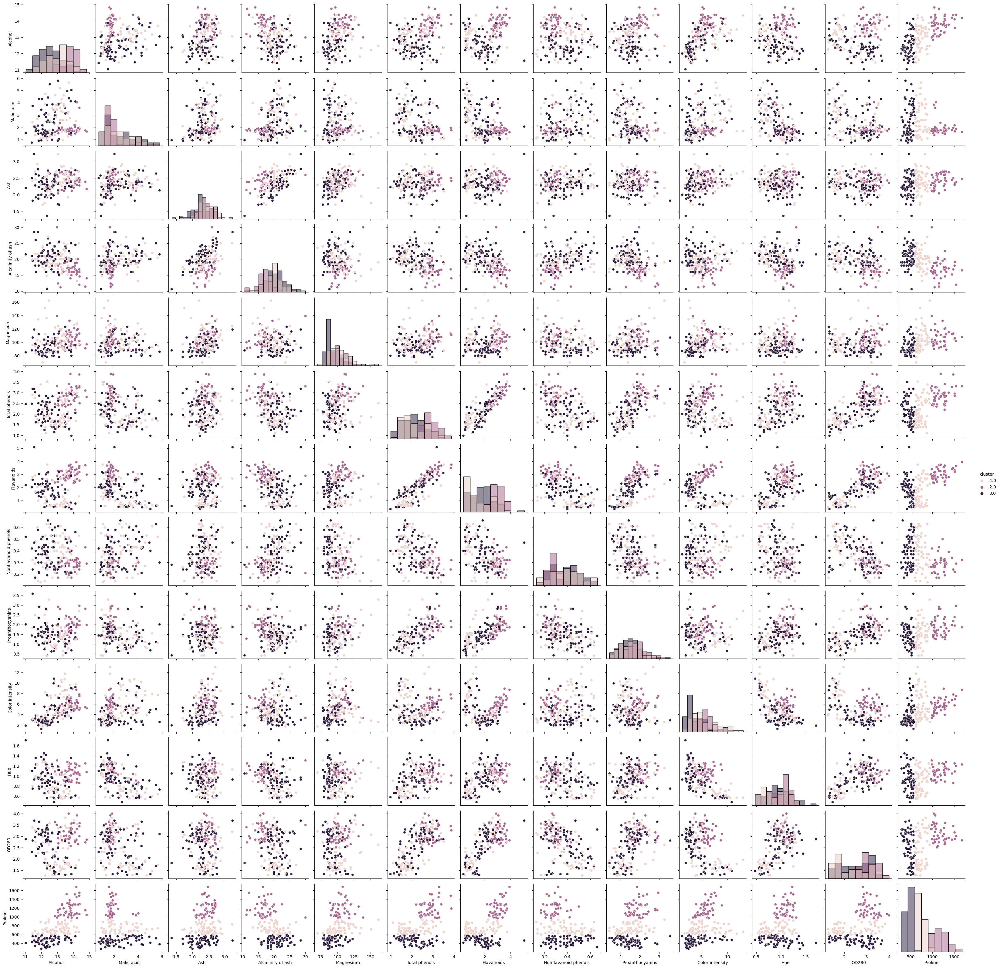

In [37]:
sns_plot = sns.pairplot(wd, hue = "cluster",diag_kind="hist")

#Normalize data by removing the mean and scaling to unit variance using
`preprocessing.StandardScaler` and do kMeans again.

In [39]:
standardScaler = preprocessing.StandardScaler()

In [40]:
standardScaler.fit(wd)

StandardScaler()

In [41]:
X_scaled_array = standardScaler.transform(wd)

In [42]:
normalizedData = pd.DataFrame(X_scaled_array, columns = wd.columns)

In [43]:
kMeansClustering = KMeans(n_clusters = 3, random_state=0)

In [44]:
res = kMeansClustering.fit_predict(wd)
label_pred_KM = res + 1

In [45]:
wd["cluster"] = label_pred_KM.astype('float64')

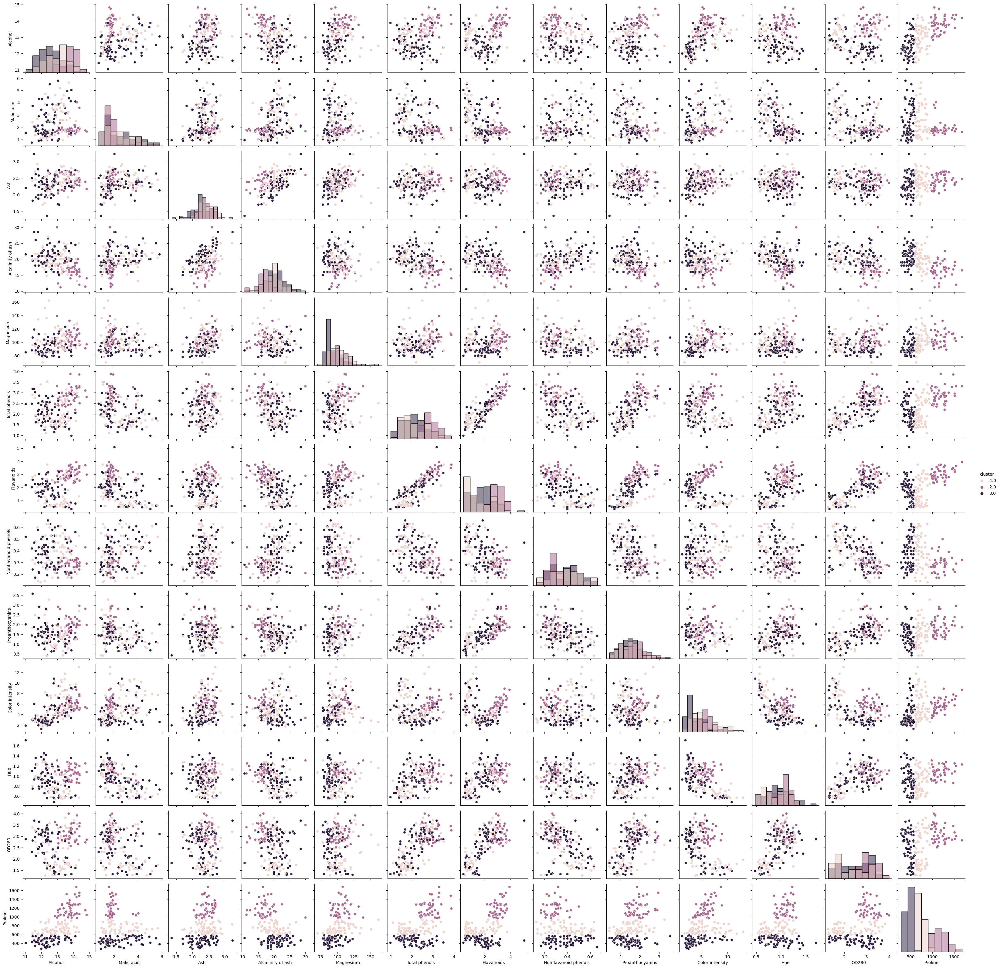

In [46]:
sns_plot = sns.pairplot(wd, hue = "cluster",diag_kind="hist")